# Player Performance

En este notebook se pretende realizar un análisis del rendimiento de equipo. Algunos de los aspectos que se van a analizar:

   - Goalkeepers:
       - Number of goals conceded.
       - Number of shots on target received.
       - Number of saves.
       - Save percentage.
       - Number of clean sheets.
       - Number of penalty kicks saved.
       - Number of passes.

   - Defenders:
       - Number of ball recoveries.
       - Number of duels won.
       - Number of blocks.
       - Number of interceptions.
       - Number of clearences.
       - Number of committed fouls.

   - Midfielders:
       - Number of ball recoveries.
       - Number of duels won.
       - Number of interceptions.
       - Number of committed fouls.
       - Number of won fouls.
       - Number of passes.
       - Number of passes final third.
       - Number of that precede a shot.
       - Number of assist.
       - Number of goals.
       - Number of dribbles.       
       
   - Forwards:
       - Number of passes that end in final third.
       - Number of passes that precede a shot.
       - Number of assists.
       - Number of shots.
       - Number of shots on target.
       - Shot rate per goal.
       - Expected goals generated.
       - Number of goals.
       - Number of dribbles.
       - Number of goals outside the penalty area.
       - Expected goals generated.
       - Number of won fouls.

A study of the expected threat generated will be done.

In [90]:
#importando paquetes necesarios para visualizar y manipular datos
from statsbombpy import sb
import pandas as pd
import numpy as np
from mplsoccer import VerticalPitch,Pitch
from highlight_text import ax_text, fig_text
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects
import matplotlib.ticker as ticker
from scipy import stats
import json
from PIL import Image
import urllib


import warnings
warnings.filterwarnings("ignore")

pd.options.display.max_columns = None
pd.options.display.max_rows = 20

In [94]:
## De esta amnera se pueden obtener todos los eventos de una temporada.
dfSpain = sb.competition_events(    
    country="Spain",
    division= "La Liga",
    season="2015/2016",
    gender="male")

dfItaly = sb.competition_events(    
    country="Italy",
    division= "Serie A",
    season="2015/2016",
    gender="male")

dfEngland = sb.competition_events(    
    country="England",
    division= "Premier League",
    season="2015/2016",
    gender="male")

dfGermany = sb.competition_events(    
    country="Germany",
    division= "1. Bundesliga",
    season="2015/2016",
    gender="male")


/Users/javiermazario/miniconda3/envs/tfm/lib/python3.11/site-packages/statsbombpy/api_client.py:21: NoAuthWarning: credentials were not supplied. open data access only
  warnings.warn(
/Users/javiermazario/miniconda3/envs/tfm/lib/python3.11/site-packages/statsbombpy/api_client.py:21: NoAuthWarning: credentials were not supplied. open data access only
  warnings.warn(
/Users/javiermazario/miniconda3/envs/tfm/lib/python3.11/site-packages/statsbombpy/api_client.py:21: NoAuthWarning: credentials were not supplied. open data access only
  warnings.warn(
/Users/javiermazario/miniconda3/envs/tfm/lib/python3.11/site-packages/statsbombpy/api_client.py:21: NoAuthWarning: credentials were not supplied. open data access only
  warnings.warn(
/Users/javiermazario/miniconda3/envs/tfm/lib/python3.11/site-packages/statsbombpy/api_client.py:21: NoAuthWarning: credentials were not supplied. open data access only
  warnings.warn(
/Users/javiermazario/miniconda3/envs/tfm/lib/python3.11/site-packages/stats

In [95]:
dfSpainMatches = sb.matches(competition_id=11, season_id=27)
dfSpain = dfSpain.merge(dfSpainMatches, on='match_id', how='left')

dfItalyMatches = sb.matches(competition_id=12, season_id=27)
dfItaly = dfItaly.merge(dfItalyMatches, on='match_id', how='left')

dfEnglandMatches = sb.matches(competition_id=2, season_id=27)
dfEngland = dfEngland.merge(dfEnglandMatches, on='match_id', how='left')

dfGermanyMatches = sb.matches(competition_id=9, season_id=27)
dfGermany = dfGermany.merge(dfGermanyMatches, on='match_id', how='left')

In [103]:
matchesSpain = dfSpain.match_id.unique()
matchesGermany = dfGermany.match_id.unique()
matchesEngland = dfEngland.match_id.unique()
matchesItaly = dfItaly.match_id.unique()

In [118]:
import pandas as pd

# Assuming you have the following match_id arrays from your unique operation
matchesSpain = dfSpain.match_id.unique()
matchesGermany = dfGermany.match_id.unique()
matchesEngland = dfEngland.match_id.unique()
matchesItaly = dfItaly.match_id.unique()

# Combine all match IDs into a single list
all_match_ids = list(set(matchesSpain) | set(matchesGermany) | set(matchesEngland) | set(matchesItaly))

# Initialize an empty DataFrame to store lineup data
df_lineups = pd.DataFrame()

# Loop through each match ID and fetch the lineup
for match_id in all_match_ids:
    try:
        # Fetch the lineup for the match
        lineup_dict = sb.lineups(match_id=match_id)
        
        # Extract DataFrames from the dictionary and concatenate them
        for team, lineup_df in lineup_dict.items():
            # Add the match_id and team name to the lineup dataframe
            lineup_df['match_id'] = match_id
            lineup_df['team'] = team
            
            # Append the lineup dataframe to the main df_lineups
            df_lineups = pd.concat([df_lineups, lineup_df], ignore_index=True)
            
    except Exception as e:
        print(f"An error occurred while fetching lineup for match {match_id}: {e}")

# Now df_lineups is a DataFrame containing all the lineups



In [140]:
# Explode the 'positions' column to create a new row for each position entry
exploded_positions = df_lineups.explode('positions')

# Extract the 'position' field from the dictionaries in the new 'positions' column
exploded_positions['position'] = exploded_positions['positions'].apply(lambda x: x['position'] if isinstance(x, dict) else None)

# Drop rows where 'position' is None
exploded_positions = exploded_positions.dropna(subset=['position'])

# Group by 'player_id' and 'position', then count the occurrences
position_counts = exploded_positions.groupby(['player_name', 'position']).size().reset_index(name='counts')

# Sort the data by 'player_id' and 'counts' to find the most common position for each player
most_common_positions = position_counts.sort_values(by=['player_name', 'counts'], ascending=[True, False])

# Drop duplicates to keep only the top position for each player
most_common_positions = most_common_positions.drop_duplicates(subset=['player_name'])

# Now most_common_positions DataFrame contains the most repeated position for each player
most_common_positions = most_common_positions.reset_index(drop=True)


The positions groups are:
- **Goalkeepers**.
- **Defenders**:
  - Right Back
  - Right Center Back
  - Center Back
  - Left Center Back
  - Left Back
  - Right Wing Back
  - Left Wing Back
- **Midfielders**:
  - Right Defensive Midfield
  - Center Defensive Midfield
  - Left Defensive Midfield
  - Right Midfield
  - Right Center Midfield
  - Center Midfield
  - Left Center Midfield
  - Left Midfield
  - Right Attacking Midfield
  - Center Attacking Midfield
  - Left Attacking Midfield
- **Forwards**:
  - Left Wing
  - Right Center Forward
  - Striker
  - Left Center Forward
  - Secondary Striker


In [251]:
def fStatsShots(df):
    dfShots = df[df['type']=='Shot'].copy()
    dfShots[['shot_x', 'shot_y']] = dfShots['location'].apply(pd.Series)
    dfShots[['shot_end_x', 'shot_end_y', 'shot_end_height']] = dfShots['shot_end_location'].apply(pd.Series)
    dfShots['shot_end_height'] = dfShots['shot_end_height'].fillna(0)

    total_shots = dfShots.groupby(['player'])['player'].count().to_frame()
    total_shots = total_shots.rename(columns={'player': 'total_shots'})
    onTarget = dfShots[(dfShots['shot_outcome']=='Saved')|(dfShots['shot_outcome']=='Saved to Post')|(dfShots['shot_outcome']=='Goal')]
    offTarget = dfShots[(dfShots['shot_outcome']=='Off T')|(dfShots['shot_outcome']=='Saved Off T')]
    post = dfShots[(dfShots['shot_outcome']=='Post')]
    goals = dfShots[(dfShots['shot_outcome']=='Goal') ]
    blocked = dfShots[(dfShots['shot_outcome']=='Blocked')]
    player_teams = dfShots.groupby('player')['team'].first().reset_index()
    # Group by player and count the number of unique match_id for each player
    player_matches_played = dfShots.groupby('player')['match_id'].nunique().reset_index()
    player_matches_played = player_matches_played.rename(columns={'match_id': 'MP'})
    
    total_shots['onTarget'] = onTarget.groupby(['player'])['player'].count().to_frame()
    total_shots['offTarget'] = offTarget.groupby(['player'])['player'].count().to_frame()
    total_shots['post'] = post.groupby(['player'])['player'].count().to_frame()
    total_shots['blocked'] = blocked.groupby(['player'])['player'].count().to_frame()
    total_shots['goals'] = goals.groupby(['player'])['player'].count().to_frame()
    total_shots['xG_total'] = dfShots.groupby(['player'])['shot_statsbomb_xg'].sum().to_frame()
    
    
    total_shots = total_shots.fillna(0)
    total_shots[['onTarget', 'offTarget', 'post', 'blocked', 'goals']] = \
    total_shots[['onTarget', 'offTarget', 'post', 'blocked', 'goals']].astype(int)

    total_shots['onTarget_percentage%'] = total_shots['onTarget']/total_shots['total_shots']*100
    total_shots['Shot_to_goal_ratio'] = total_shots['goals']/total_shots['total_shots']*100
    total_shots['Shot_onTarget_to_goal_ratio'] = total_shots['goals']/total_shots['onTarget']*100
    total_shots['xG/shot'] = total_shots['xG_total']/total_shots['total_shots']

    total_shots = total_shots.merge(player_teams, on='player', how='left')
    total_shots = total_shots.merge(player_matches_played, on='player', how='left')
    total_shots['competition'] = df['competition']
    total_shots = total_shots.fillna(0)
    total_shots = total_shots.reset_index()
    return total_shots

In [252]:
dfStatsShotsSpain = fStatsShots(dfSpain)
dfStatsShotsGermany = fStatsShots(dfGermany)
dfStatsShotsEngland = fStatsShots(dfEngland)
dfStatsShotsItaly = fStatsShots(dfItaly)

In [253]:
def fStatsPass(df):
    pases = df[df['type']=='Pass'].copy()
    pases[['x', 'y']] = pases['location'].apply(pd.Series)
    pases[['pass_end_x', 'pass_end_y']] = pases['pass_end_location'].apply(pd.Series)

    dribbles = df[df['type']=='Dribble'].copy()
    dribbles[['x', 'y']] = dribbles['location'].apply(pd.Series)

    dribbles_completed = dribbles[dribbles.dribble_outcome == 'Complete']
    dribbles_f3 = dribbles[dribbles['x']>=80]
    dribbles_f3_completed = dribbles_f3[dribbles_f3.dribble_outcome =='Complete']

    fouls = df[df['type']=='Foul Won'].copy()
    player_teams = df.groupby('player')['team'].first().reset_index()
    # Group by player and count the number of unique match_id for each player
    player_matches_played = df.groupby('player')['match_id'].nunique().reset_index()
    player_matches_played = player_matches_played.rename(columns={'match_id': 'MP'})
    
    #Pase largo: pases cuya dsitancia sea >30 metros y pass_height == High Pass
    #Pase corto: pases cuya dsitancia sea <30 metros y pass_height == Ground Pass
    pases_largo = pases[(pases['pass_length'] > 30) & (pases['pass_height'] == 'High Pass')]
    pases_corto = pases[(pases['pass_length'] < 30) & (pases['pass_height'] == 'Ground Pass')]

    condicion1 = pases["pass_end_x"]>=80
    condicion2 = pases["x"]<80
    pases_f3 = pases.loc[condicion1 & condicion2,:].copy()

    crosses = pases.loc[pases.pass_cross == True]
    
    pases['pass_length_meters'] = pases['pass_length']*0.9144
    average_pass_length = pases.groupby('player')['pass_length_meters'].mean().to_frame()
    average_pass_length = average_pass_length.rename(columns={'pass_length_meters': 'average_pass_length'})
    
    #Se consideran pases completados aquellos cuyo valor de pass_outcome sea null, incompletos para cualquier otro valor.
    completos = pases[pases['pass_outcome'].isnull()]
    incompletos = pases[pases['pass_outcome'].notnull()]
    
    completos_f3 = pases_f3[pases_f3['pass_outcome'].isnull()]
    incompletos_f3 = pases_f3[pases_f3['pass_outcome'].notnull()]
    
    completos_corto = pases_corto[pases_corto['pass_outcome'].isnull()]
    incompletos_corto = pases_corto[pases_corto['pass_outcome'].notnull()]
    
    completos_largo = pases_largo[pases_largo['pass_outcome'].isnull()]
    incompletos_largo = pases_largo[pases_largo['pass_outcome'].notnull()]

    completos_crosses = crosses[crosses['pass_outcome'].isnull()]
    incompletos_crosses = crosses[crosses['pass_outcome'].notnull()]

    shot_assist = df[df.pass_shot_assist == True]
    goal_assist = df[df.pass_goal_assist == True]

    shot_assist_df = shot_assist.groupby('player')['type'].count().to_frame()
    shot_assist_df = shot_assist_df.rename(columns={'type': 'total_shot_assists'})

    goal_assist_df = goal_assist.groupby('player')['type'].count().to_frame()
    goal_assist_df = goal_assist_df.rename(columns={'type': 'total_goal_assists'})

    pases_df = pases.groupby('player')['type'].count().to_frame()
    pases_df = pases_df.rename(columns={'type': 'total_passes'})
    pases_df['total_completed'] = completos.groupby(['player'])['type'].count().to_frame()
    pases_df['total_uncompleted'] = incompletos.groupby(['player'])['type'].count().to_frame()
    pases_df = pases_df.fillna(0)
    pases_df = pases_df.reset_index()
    pases_df['total_percentage%'] = pases_df['total_completed']/pases_df['total_passes']*100

    corto_df = pases_corto.groupby('player')['type'].count().to_frame()
    corto_df = corto_df.rename(columns={'type': 'short_passes'})
    corto_df['short_completed'] = completos_corto.groupby(['player'])['type'].count().to_frame()
    corto_df['short_uncompleted'] = incompletos_corto.groupby(['player'])['type'].count().to_frame()
    corto_df = corto_df.fillna(0)
    corto_df = corto_df.reset_index()
    corto_df['short_percentage%'] = corto_df['short_completed']/corto_df['short_passes']*100
        
    largo_df = pases_largo.groupby('player')['type'].count().to_frame()
    largo_df = largo_df.rename(columns={'type': 'long_passes'})
    largo_df['long_completed'] = completos_largo.groupby(['player'])['type'].count().to_frame()
    largo_df['long_uncompleted'] = incompletos_largo.groupby(['player'])['type'].count().to_frame()
    largo_df = largo_df.fillna(0)
    largo_df = largo_df.reset_index()
    largo_df['long_percentage%'] = largo_df['long_completed']/largo_df['long_passes']*100

    f3_df = pases_f3.groupby('player')['type'].count().to_frame()
    f3_df = f3_df.rename(columns={'type': 'f3_passes'})
    f3_df['f3_completed'] = completos_f3.groupby(['player'])['type'].count().to_frame()
    f3_df['f3_uncompleted'] = incompletos_f3.groupby(['player'])['type'].count().to_frame()
    f3_df = f3_df.fillna(0)
    f3_df = f3_df.reset_index()
    f3_df['f3_percentage%'] = f3_df['f3_completed']/f3_df['f3_passes']*100

    crosses = crosses.groupby('player')['type'].count().to_frame()
    crosses = crosses.rename(columns={'type': 'crosses'})
    crosses['crosses_completed'] = completos_crosses.groupby(['player'])['type'].count().to_frame()
    crosses['crosses_uncompleted'] = incompletos_crosses.groupby(['player'])['type'].count().to_frame()
    crosses = crosses.fillna(0)
    crosses = crosses.reset_index()
    crosses['crosses_percentage%'] = crosses['crosses_completed']/crosses['crosses']*100

    dribbles = dribbles.groupby('player')['type'].count().to_frame()
    dribbles = dribbles.rename(columns={'type': 'dribbles'})
    dribbles['dribbles_completed'] = dribbles_completed.groupby(['player'])['type'].count().to_frame()
    dribbles['dribbles_f3'] = dribbles_f3.groupby('player')['type'].count().to_frame()
    dribbles['dribbles_f3_completed'] = dribbles_f3_completed.groupby('player')['type'].count().to_frame()
    dribbles = dribbles.fillna(0)
    dribbles = dribbles.reset_index()

    fouls = fouls.groupby('player')['type'].count().to_frame()
    fouls = fouls.rename(columns={'type': 'fouls_won'})

    combined_df = pases_df.merge(f3_df, on='player', how='left')
    combined_df = combined_df.merge(corto_df, on='player', how='left')
    combined_df = combined_df.merge(largo_df, on='player', how='left')
    combined_df = combined_df.merge(average_pass_length, on='player', how='left')
    combined_df = combined_df.merge(crosses, on='player', how='left')
    combined_df = combined_df.merge(shot_assist_df, on='player', how='left')
    combined_df = combined_df.merge(goal_assist_df, on='player', how='left')
    combined_df = combined_df.merge(dribbles, on='player', how='left')
    combined_df = combined_df.merge(fouls, on='player', how='left')
    combined_df = combined_df.merge(player_teams, on='player', how='left')
    combined_df = combined_df.merge(player_matches_played, on='player', how='left')
    combined_df['competition'] = df['competition']

    combined_df = combined_df.fillna(0)
    combined_df[['total_uncompleted', 'f3_passes', 'f3_completed', 'f3_uncompleted', 'short_passes', 'short_completed', 'short_uncompleted', 'long_passes', 'long_completed', 'long_uncompleted', 'crosses', 'crosses_completed', 'crosses_uncompleted', 'total_shot_assists', 'total_goal_assists', 'dribbles', 'dribbles_completed', 'dribbles_f3', 'dribbles_f3_completed', 'fouls_won']] = combined_df[['total_uncompleted', 'f3_passes', 'f3_completed', 'f3_uncompleted', 'short_passes', 'short_completed', 'short_uncompleted', 'long_passes', 'long_completed', 'long_uncompleted', 'crosses', 'crosses_completed', 'crosses_uncompleted', 'total_shot_assists', 'total_goal_assists', 'dribbles', 'dribbles_completed', 'dribbles_f3', 'dribbles_f3_completed', 'fouls_won']].astype(int)
    combined_df = combined_df.reset_index()


    return combined_df

In [254]:
dfStatsPassSpain = fStatsPass(dfSpain)
dfStatsPassGermany = fStatsPass(dfGermany)
dfStatsPassEngland = fStatsPass(dfEngland)
dfStatsPassItaly = fStatsPass(dfItaly)

In [255]:
def fStatsDefense(df):
    recoveries = df[(df['type']=='Ball Recovery') & (df.ball_recovery_recovery_failure != True)].copy()
    recoveries[['x', 'y']] = recoveries['location'].apply(pd.Series)

    duels = df[(df['type']=='Duel')].copy()
    duels_won =  df[(df.duel_outcome == 'Won') | (df.duel_outcome == 'Success In Play') | (df.duel_outcome == 'Success Out')]

    fouls = df[(df['type']=='Foul Committed')].copy()
    fouls[['x', 'y']] = fouls['location'].apply(pd.Series)

    blocks = df[(df['type']=='Block')].copy()
    save_block = blocks[blocks['block_save_block'] == True]

    clearances = df[(df['type']=='Clearance')].copy()
    pressure = df[(df['type']=='Pressure')].copy()
    interception = df[(df['type']=='Interception')].copy()

    player_teams = df.groupby('player')['team'].first().reset_index()
    # Group by player and count the number of unique match_id for each player
    player_matches_played = df.groupby('player')['match_id'].nunique().reset_index()
    player_matches_played = player_matches_played.rename(columns={'match_id': 'MP'})

    # Merge the aggregated results with the combined_df
    combined_df = recoveries.groupby(['player'])['player'].count().to_frame()
    combined_df = combined_df.rename(columns={'player': 'recoveries'})
    combined_df['duels'] = duels.groupby(['player'])['player'].count().to_frame()
    combined_df['duels_won'] = duels_won.groupby(['player'])['player'].count().to_frame()
    combined_df['fouls_committed'] = fouls.groupby(['player'])['player'].count().to_frame()
    combined_df['shot_blocked'] = blocks.groupby(['player'])['player'].count().to_frame()
    combined_df['clearances'] = clearances.groupby(['player'])['player'].count().to_frame()
    combined_df['pressure'] = pressure.groupby(['player'])['player'].count().to_frame()
    combined_df['interceptions'] = interception.groupby(['player'])['player'].count().to_frame()
    combined_df = combined_df.merge(player_teams, on='player', how='left')
    combined_df = combined_df.merge(player_matches_played, on='player', how='left')
    combined_df['competition'] = df['competition']

    combined_df = combined_df.fillna(0)
    combined_df[['duels', 'duels_won', 'fouls_committed', 'shot_blocked', 'clearances', 'pressure', 'interceptions']] = combined_df[['duels', 'duels_won', 'fouls_committed', 'shot_blocked', 'clearances', 'pressure', 'interceptions']].astype(int)
    combined_df = combined_df.reset_index()


    return combined_df

In [256]:
dfStatsDefenseSpain = fStatsDefense(dfSpain)
dfStatsDefenseGermany = fStatsDefense(dfGermany)
dfStatsDefenseEngland = fStatsDefense(dfEngland)
dfStatsDefenseItaly = fStatsDefense(dfItaly)

In [257]:
def fStatsGK(df):

    goals_against = df[(df['goalkeeper_type']=='Goal Conceded') | (df['goalkeeper_type']=='Penalty Conceded')].copy()
    penalty_goals = df[(df['goalkeeper_type']=='Penalty Conceded')].copy()
    penalty_saves = df[(df['goalkeeper_type']=='Penalty Saved') | (df['goalkeeper_type']=='Penalty Saved To Post')].copy()
    shot_saved = df[(df['goalkeeper_type']=='Shot Saved') | (df['goalkeeper_type']=='Shot Saved To Post')].copy()
    both_hands = shot_saved[shot_saved['goalkeeper_body_part']=='Both Hands']
    chest = shot_saved[shot_saved['goalkeeper_body_part']=='Chest']
    head = shot_saved[shot_saved['goalkeeper_body_part']=='Head']
    left_foot = shot_saved[shot_saved['goalkeeper_body_part']=='Left Foot']
    left_hand = shot_saved[shot_saved['goalkeeper_body_part']=='Left Hand']
    right_foot = shot_saved[shot_saved['goalkeeper_body_part']=='Right Foot']
    right_hand = shot_saved[shot_saved['goalkeeper_body_part']=='Right Hand']
    player_teams = df.groupby('player')['team'].first().reset_index()
    # Group by player and count the number of unique match_id for each player
    player_matches_played = df.groupby('player')['match_id'].nunique().reset_index()
    player_matches_played = player_matches_played.rename(columns={'match_id': 'MP'})

    combined_df = goals_against.groupby(['player'])['player'].count().to_frame()
    combined_df = combined_df.rename(columns={'player': 'total_goals_against'})
    combined_df['penalty_goals_against'] = penalty_goals.groupby(['player'])['player'].count().to_frame()
    combined_df['penalty_saves'] = penalty_saves.groupby(['player'])['player'].count().to_frame()
    combined_df = combined_df.fillna(0)
    combined_df['non_penalty_goals_against'] = combined_df['total_goals_against'] - combined_df['penalty_goals_against']
    combined_df['penalty_onTarget_attempts'] = combined_df['penalty_goals_against'] + combined_df['penalty_saves']
    combined_df['penalty_saves_percentage%'] = (combined_df['penalty_saves']/combined_df['penalty_onTarget_attempts'])*100
    combined_df['shot_onTarget_saved'] = shot_saved.groupby(['player'])['player'].count().to_frame()
    combined_df['save%'] = (combined_df['shot_onTarget_saved']/(combined_df['shot_onTarget_saved'] + combined_df['non_penalty_goals_against']))*100
    combined_df['save_both_hands'] = both_hands.groupby('player')['player'].count().to_frame()
    combined_df['save_chest'] = chest.groupby('player')['player'].count().to_frame()
    combined_df['save_head'] = head.groupby('player')['player'].count().to_frame()
    combined_df['save_left_foot'] = left_foot.groupby('player')['player'].count().to_frame()
    combined_df['save_left_hand'] = left_hand.groupby('player')['player'].count().to_frame()
    combined_df['right_foot'] = right_foot.groupby('player')['player'].count().to_frame()
    combined_df['save_right_hand'] = right_hand.groupby('player')['player'].count().to_frame()
    combined_df = combined_df.merge(player_teams, on='player', how='left')
    combined_df = combined_df.merge(player_matches_played, on='player', how='left')
    combined_df['competition'] = df['competition']
    combined_df = combined_df.fillna(0)
    columns_to_convert = [
    'total_goals_against', 'penalty_goals_against', 'penalty_saves', 
    'non_penalty_goals_against', 'penalty_onTarget_attempts', 'shot_onTarget_saved', 
    'save_both_hands', 'save_chest', 'save_head', 'save_left_foot', 
    'save_left_hand', 'right_foot', 'save_right_hand'
    ]

    combined_df[columns_to_convert] = combined_df[columns_to_convert].astype(int)
    combined_df = combined_df.reset_index()

    
    return combined_df

In [258]:
dfGKStatsSpain = fStatsGK(dfSpain)
dfGKStatsGermany = fStatsGK(dfGermany)
dfGKStatsItaly = fStatsGK(dfItaly)
dfGKStatsEngland = fStatsGK(dfEngland)

In [259]:
dfStatsShots = pd.concat([dfStatsShotsSpain, dfStatsShotsGermany, dfStatsShotsItaly, dfStatsShotsEngland], axis=0)
dfStatsPass = pd.concat([dfStatsPassSpain, dfStatsPassGermany, dfStatsPassItaly, dfStatsPassEngland], axis=0)
dfStatsDefense = pd.concat([dfStatsDefenseSpain, dfStatsDefenseGermany, dfStatsDefenseItaly, dfStatsDefenseEngland], axis=0)
dfStatsGK = pd.concat([dfGKStatsSpain, dfGKStatsGermany, dfGKStatsItaly, dfGKStatsEngland], axis=0)

In [260]:
dfStatsShotsSpain.to_csv('dataFramesPlayers/dfStatsShotsSpain.csv', index=False)
dfStatsShotsGermany.to_csv('dataFramesPlayers/dfStatsShotsGermany.csv', index=False)
dfStatsShotsItaly.to_csv('dataFramesPlayers/dfStatsShotsItaly.csv', index=False)
dfStatsShotsEngland.to_csv('dataFramesPlayers/dfStatsShotsEngland.csv', index=False)
dfStatsShots.to_csv('dataFramesPlayers/dfStatsShots.csv', index=False)

dfStatsDefenseSpain.to_csv('dataFramesPlayers/dfStatsDefenseSpain.csv', index=False)
dfStatsDefenseGermany.to_csv('dataFramesPlayers/dfStatsDefenseGermany.csv', index=False)
dfStatsDefenseItaly.to_csv('dataFramesPlayers/dfStatsDefenseItaly.csv', index=False)
dfStatsDefenseEngland.to_csv('dataFramesPlayers/dfStatsDefenseEngland.csv', index=False)
dfStatsDefense.to_csv('dataFramesPlayers/dfStatsDefense.csv', index=False)

dfStatsPassSpain.to_csv('dataFramesPlayers/dfStatsPassSpain.csv', index=False)
dfStatsPassGermany.to_csv('dataFramesPlayers/dfStatsPassGermany.csv', index=False)
dfStatsPassItaly.to_csv('dataFramesPlayers/dfStatsPassItaly.csv', index=False)
dfStatsPassEngland.to_csv('dataFramesPlayers/dfStatsPassEngland.csv', index=False)
dfStatsPass.to_csv('dataFramesPlayers/dfStatsPass.csv', index=False)

dfGKStatsSpain.to_csv('dataFramesPlayers/dfStatsGKSpain.csv', index=False)
dfGKStatsGermany.to_csv('dataFramesPlayers/dfStatsGKGermany.csv', index=False)
dfGKStatsItaly.to_csv('dataFramesPlayers/dfStatsGKItaly.csv', index=False)
dfGKStatsEngland.to_csv('dataFramesPlayers/dfStatsGKEngland.csv', index=False)
dfStatsGK.to_csv('dataFramesPlayers/dfStatsGK.csv', index=False)


In [403]:
dfStatsPass = dfStatsPass.rename(columns={'MP': 'MP_p'})
dfStatsShots = dfStatsShots.rename(columns={'MP': 'MP_s'})
dfStatsDefense = dfStatsDefense.rename(columns={'MP': 'MP_d'})
dfStatsGK = dfStatsGK.rename(columns={'MP': 'MP_gk'})


In [292]:
dfStats = pd.DataFrame()
dfStats = pd.merge(dfStatsPass, dfStatsShots, on=['player', 'team', 'competition'], how='outer')
dfStats = pd.merge(dfStats, dfStatsDefense, on=['player', 'team', 'competition'], how='outer')
dfStats = pd.merge(dfStats, dfStatsGK, on=['player', 'team', 'competition'], how='outer')

In [294]:
dfStats = dfStats.drop(columns=['index_x', 'index_y'])
dfStats = dfStats.reset_index(drop=True)
dfStats['MP_p'] = dfStats['MP_p'].fillna(dfStats['MP_s'])
dfStats['MP_p'] = dfStats['MP_p'].fillna(dfStats['MP_gk'])
dfStats['MP_p'] = dfStats['MP_p'].fillna(dfStats['MP_d'])
dfStats = dfStats.drop(columns=['MP_s', 'MP_d', 'MP_gk'])
dfStats = dfStats.rename(columns={'MP_p': 'MP'})
dfStats = dfStats.fillna(0)

columns_to_convert = [
    'total_passes', 'total_completed', 'total_uncompleted',
    'f3_passes', 'f3_completed', 'f3_uncompleted', 'short_passes',
    'short_completed', 'short_uncompleted', 'long_passes',
    'long_completed', 'long_uncompleted',
    'crosses', 'crosses_completed', 'crosses_uncompleted',
    'total_shot_assists', 'total_goal_assists', 'dribbles', 'dribbles_completed',
    'dribbles_f3', 'dribbles_f3_completed', 'fouls_won', 'MP', 'total_shots',
    'onTarget', 'offTarget', 'post', 'blocked', 'goals',
    'recoveries', 'duels', 'duels_won', 'fouls_committed', 'shot_blocked',
    'clearances', 'pressure', 'interceptions', 'total_goals_against', 'penalty_goals_against',
    'penalty_saves', 'non_penalty_goals_against', 'penalty_onTarget_attempts',
    'shot_onTarget_saved', 'save_both_hands', 'save_chest', 'save_head',
    'save_left_foot', 'save_left_hand', 'right_foot', 'save_right_hand'
]

dfStats[columns_to_convert] = dfStats[columns_to_convert].astype(int)

In [295]:
import pandas as pd

# Your DataFrame (df) goes here

# Define a dictionary to map positions to their respective groups
position_groups = {
    'Goalkeeper': 'Goalkeepers',
    'Right Back': 'Defenders',
    'Right Center Back': 'Defenders',
    'Center Back': 'Defenders',
    'Left Center Back': 'Defenders',
    'Left Back': 'Defenders',
    'Right Wing Back': 'Defenders',
    'Left Wing Back': 'Defenders',
    'Right Defensive Midfield': 'Midfielders',
    'Center Defensive Midfield': 'Midfielders',
    'Left Defensive Midfield': 'Midfielders',
    'Right Midfield': 'Midfielders',
    'Right Center Midfield': 'Midfielders',
    'Center Midfield': 'Midfielders',
    'Left Center Midfield': 'Midfielders',
    'Left Midfield': 'Midfielders',
    'Right Attacking Midfield': 'Midfielders',
    'Center Attacking Midfield': 'Midfielders',
    'Left Attacking Midfield': 'Midfielders',
    'Left Wing': 'Forwards',
    'Right Center Forward': 'Forwards',
    'Striker': 'Forwards',
    'Left Center Forward': 'Forwards',
    'Secondary Striker': 'Forwards',
    'Right Wing': 'Forwards',
    'Center Forward': 'Forwards'
}

# Function to map the position to the group
def map_position_to_group(position):
    return position_groups.get(position, 'Other')

# Apply the function to the 'position' column to create a new 'group' column
most_common_positions['group'] = most_common_positions['position'].apply(map_position_to_group)

# Display the DataFrame with the new 'group' column
print(most_common_positions)


                player_name                   position  counts        group
0           Aaron Cresswell                  Left Back      36    Defenders
1                Aaron Hunt  Center Attacking Midfield      22  Midfielders
2              Aaron Lennon                 Right Wing      17     Forwards
3     Aaron Mattia Tabacchi                  Left Wing       1     Forwards
4              Aaron Ramsey    Left Defensive Midfield      13  Midfielders
...                     ...                        ...     ...          ...
2082       Łukasz Skorupski                 Goalkeeper      31  Goalkeepers
2083         Łukasz Załuska                 Goalkeeper       1  Goalkeepers
2084     Ştefan Daniel Radu                  Left Back      12    Defenders
2085          Šime Vrsaljko                 Right Back      38    Defenders
2086           Željko Brkić                 Goalkeeper       4  Goalkeepers

[2087 rows x 4 columns]


In [296]:
dfStats = dfStats.merge(most_common_positions[['player_name', 'position', 'group']], 
                        left_on='player', 
                        right_on='player_name', 
                        how='left')


In [297]:
dfStats = dfStats.drop(columns=['player_name'])

In [298]:
dfStats.to_csv('dataFramesPlayers/dfStats.csv', index=False)

In [2]:
dfStats = pd.read_csv('dataFramesPlayers/dfStats.csv')
dfStatsGK = pd.read_csv('dataFramesPlayers/dfStatsGK.csv')
dfStatsDefense = pd.read_csv('dataFramesPlayers/dfStatsDefense.csv')
dfStatsPass = pd.read_csv('dataFramesPlayers/dfStatsPass.csv')
dfStatsShot = pd.read_csv('dataFramesPlayers/dfStatsShots.csv')

In [411]:
dfStatsShots

,index,player,total_shots,onTarget,offTarget,post,blocked,goals,xG_total,onTarget_percentage%,Shot_to_goal_ratio,Shot_onTarget_to_goal_ratio,xG/shot,team,MP_s,competition
0,0,Abdoul Karim Yoda,8,1,3,0,4,0,0.830659,12.500000,0.000000,0.0,0.103832,Getafe,6,Spain - La Liga
1,1,Abdoulaye Doucouré,10,0,3,0,5,0,0.759716,0.000000,0.000000,0.0,0.075972,Granada,8,Spain - La Liga
2,2,Abraham González Casanova,16,8,4,1,3,1,2.834417,50.000000,6.250000,12.5,0.177151,Espanyol,9,Spain - La Liga
3,3,Adalberto Peñaranda Maestre,22,8,8,0,6,5,1.895202,36.363636,22.727273,62.5,0.086146,Granada,16,Spain - La Liga
4,4,Aderllan Leandro de Jesus Santos,8,2,3,0,1,0,1.080425,25.000000,0.000000,0.0,0.135053,Valencia,8,Spain - La Liga
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
447,447,Younes Kaboul,11,5,5,0,1,0,0.756384,45.454545,0.000000,0.0,0.068762,Sunderland,9,England - Premier League
448,448,Youssouf Chafiq Mulumbu Ngangu,3,1,1,0,1,0,0.183267,33.333333,0.000000,0.0,0.061089,Norwich City,2,England - Premier League
449,449,Àngel Rangel Zaragoza,14,0,6,1,5,0,0.683599,0.000000,0.000000,0.0,0.048828,Swansea City,11,England - Premier League
450,450,Éderzito António Macedo Lopes,5,1,4,0,0,0,0.395401,20.000000,0.000000,0.0,0.079080,Swansea City,4,England - Premier League


## K-Means

### Goalkeepers

Feature Selection:
- Total passes and success rate.
- Short passes and success rate.
- Long passes and success rate.
- Average pass length.
- Total goals against.
- Penalty goals against.
- Penalty saves and success rate.
- Non penalty goals against.
- Shot on target saved.
- Saves rate.
- Types of saves: both hands, chest, head, left foot, left hand, right foot, right hand.


In [91]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns
pd.options.display.max_rows = 10

In [92]:
dfStatsGK.MP.describe()

count    166.000000
mean      17.783133
std       14.064827
min        1.000000
25%        3.250000
50%       15.000000
75%       33.000000
max       38.000000
Name: MP, dtype: float64

In [93]:
dfModelGK = dfStats[(dfStats.group == 'Goalkeepers') & (dfStats.MP > 17)]
dfModelGK

,player,total_passes,total_completed,total_uncompleted,total_percentage%,f3_passes,f3_completed,f3_uncompleted,f3_percentage%,short_passes,short_completed,short_uncompleted,short_percentage%,long_passes,long_completed,long_uncompleted,long_percentage%,average_pass_length,crosses,crosses_completed,crosses_uncompleted,crosses_percentage%,total_shot_assists,total_goal_assists,dribbles,dribbles_completed,dribbles_f3,dribbles_f3_completed,fouls_won,team,MP,competition,total_shots,onTarget,offTarget,post,blocked,goals,xG_total,onTarget_percentage%,Shot_to_goal_ratio,Shot_onTarget_to_goal_ratio,xG/shot,recoveries,duels,duels_won,fouls_committed,shot_blocked,clearances,pressure,interceptions,total_goals_against,penalty_goals_against,penalty_saves,non_penalty_goals_against,penalty_onTarget_attempts,penalty_saves_percentage%,shot_onTarget_saved,save%,save_both_hands,save_chest,save_head,save_left_foot,save_left_hand,right_foot,save_right_hand,position,group
30,Alphonse Areola,861,481,380,55.865273,86,22,64,25.581395,179,178,1,99.441341,591,220,371,37.225042,46.551000,0,0,0,0.0,0,0,1,1,0,0,8,Villarreal,32,Spain - La Liga,0,0,0,0,0,0,0.000000,0.0,0.0,0.0,0.000000,160,0,0,1,2,1,2,0,25,1,1,24,2,50.0,82,77.358491,57,1,0,6,3,4,11,Goalkeeper,Goalkeepers
37,Andrés Eduardo Fernández Moreno,1136,644,492,56.690141,133,30,103,22.556391,251,248,3,98.804781,784,304,480,38.775510,45.703605,0,0,0,0.0,2,0,2,1,0,0,9,Granada,37,Spain - La Liga,0,0,0,0,0,0,0.000000,0.0,0.0,0.0,0.000000,211,1,1,1,2,2,6,0,64,4,0,60,4,0.0,100,62.500000,64,1,1,6,7,6,15,Goalkeeper,Goalkeepers
42,Antonio Adán Garrido,1144,496,648,43.356643,239,52,187,21.757322,157,157,0,100.000000,888,256,632,28.828829,50.868718,0,0,0,0.0,2,0,1,1,0,0,3,Real Betis,36,Spain - La Liga,0,0,0,0,0,0,0.000000,0.0,0.0,0.0,0.000000,164,0,0,1,0,1,6,0,49,0,0,49,0,0.0,125,71.839080,81,4,1,8,8,8,15,Goalkeeper,Goalkeepers
60,Asier Riesgo Unamuno,1066,506,560,47.467167,188,59,129,31.382979,70,69,1,98.571429,910,361,549,39.670330,52.425916,0,0,0,0.0,1,0,0,0,0,0,10,Eibar,34,Spain - La Liga,0,0,0,0,0,0,0.000000,0.0,0.0,0.0,0.000000,210,0,0,1,0,6,3,0,53,3,1,50,4,25.0,79,61.240310,54,0,1,6,5,3,10,Goalkeeper,Goalkeepers
94,Claudio Andrés Bravo Muñoz,1004,848,156,84.462151,38,10,28,26.315789,573,570,3,99.476440,247,107,140,43.319838,28.536040,0,0,0,0.0,0,0,1,1,0,0,1,Barcelona,32,Spain - La Liga,0,0,0,0,0,0,0.000000,0.0,0.0,0.0,0.000000,119,0,0,0,1,2,3,0,20,1,0,19,1,0.0,83,81.372549,66,3,1,2,6,2,3,Goalkeeper,Goalkeepers
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2054,Thibaut Courtois,638,370,268,57.993730,73,14,59,19.178082,179,178,1,99.441341,382,124,258,32.460733,44.285771,0,0,0,0.0,0,0,0,0,0,0,3,Chelsea,23,England - Premier League,0,0,0,0,0,0,0.000000,0.0,0.0,0.0,0.000000,110,0,0,2,1,2,4,0,27,1,1,26,2,50.0,65,71.428571,50,2,0,1,4,5,3,Goalkeeper,Goalkeepers
2056,Tim Howard,805,554,251,68.819876,51,9,42,17.647059,322,321,1,99.689441,391,150,241,38.363171,38.370311,0,0,0,0.0,0,0,1,1,0,0,2,Everton,25,England - Premier League,0,0,0,0,0,0,0.000000,0.0,0.0,0.0,0.000000,142,0,0,2,3,2,6,0,35,4,0,31,4,0.0,87,73.728814,55,1,1,7,5,10,8,Goalkeeper,Goalkeepers
2077,Vito Mannone,633,277,356,43.759874,170,48,122,28.235294,85,85,0,100.000000,495,145,350,29.292929,52.437560,0,0,0,0.0,0,0,0,0,0,0,5,Sunderland,19,England - Premier League,0,0,0,0,0,0,0.000000,0.0,0.0,0.0,0.000000,111,0,0,0,0,0,2,0,23,1,0,22,1,0.0,73,76.842105,51,1,1,3,4,1,12,Goalkeeper,Goalkeepers
2080,Wayne Hennessey,869,431,438,49.597238,292,83,209,28.424658,149,149,0,100.000000,644,214,430,33.229814,53.036325,0,0,0,0.0,0,0,0,0,0,0,0,Crystal Palace,29,England - Premier League,0,0,0,0,0,0,0.000000,0.0,0.0,0.0,0.000000,132,0,0,0,0,0,3,0,35,2,0,33,2,0.0,81,71.052632,64,2,0,3,2,4,6,Goalkeeper,Goalkeepers


In [94]:
dfModelGK = dfModelGK[['player', 'total_passes', 'short_passes', 'long_passes','average_pass_length', 'total_goals_against',
                    'penalty_goals_against', 'penalty_saves', 'non_penalty_goals_against', 'penalty_saves_percentage%', 'save%', 'save_both_hands',
                    'save_chest', 'save_left_foot', 'save_left_hand', 'right_foot', 'save_right_hand', 'competition', 'team', 'MP']]

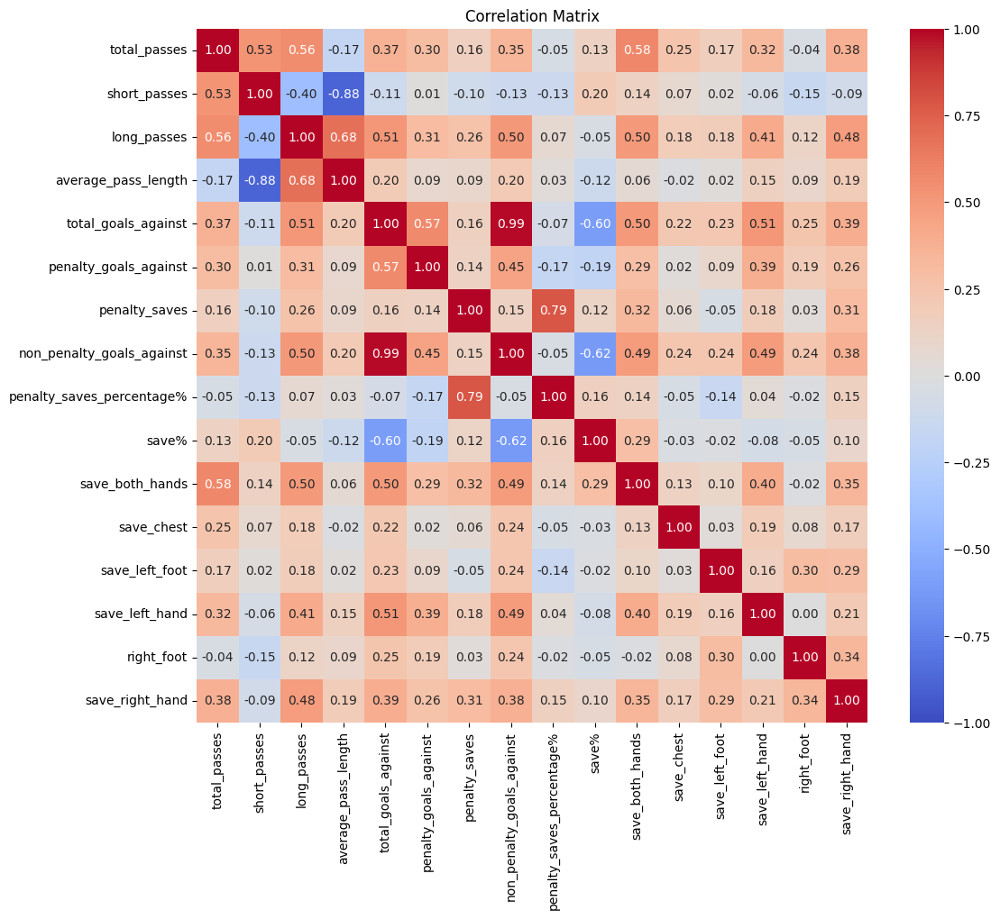

In [95]:
correlation_matrix = dfModelGK.drop(['player', 'competition', 'team', 'MP'], axis=1).corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Matrix")
plt.show()

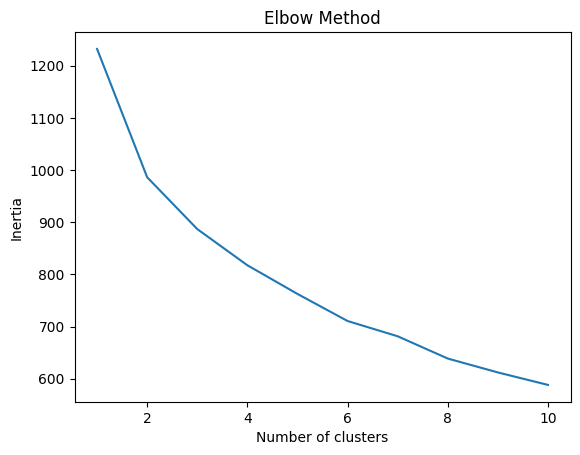

In [96]:
scaler = StandardScaler()
df_scaled = scaler.fit_transform(dfModelGK.drop(['player', 'competition', 'team', 'MP'], axis=1)) 

inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=0).fit(df_scaled)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 11), inertia)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

plt.show()

In [97]:
from sklearn.cluster import KMeans


kmeans = KMeans(n_clusters = 4, random_state=80)
kmeans.fit(df_scaled)
dfModelGK['cluster'] = kmeans.predict(df_scaled)

In [98]:
dfModelGK.cluster.value_counts()

3    28
2    19
1    15
0    15
Name: cluster, dtype: int64

In [99]:
cluster_summary = dfModelGK.groupby('cluster').mean()
cluster_summary

,total_passes,short_passes,long_passes,average_pass_length,total_goals_against,penalty_goals_against,penalty_saves,non_penalty_goals_against,penalty_saves_percentage%,save%,save_both_hands,save_chest,save_left_foot,save_left_hand,right_foot,save_right_hand,MP
cluster,,,,,,,,,,,,,,,,,
0,1085.066667,493.400000,427.200000,34.194112,33.066667,2.800000,0.066667,30.266667,2.222222,72.649402,60.133333,2.066667,3.400000,4.666667,2.800000,6.333333,32.733333
1,1071.266667,209.000000,759.333333,47.312379,56.400000,4.400000,0.600000,52.000000,11.277778,67.838135,75.133333,2.666667,5.000000,9.066667,6.533333,12.200000,34.133333
2,1179.052632,338.368421,707.578947,42.648520,41.210526,3.421053,1.526316,37.789474,28.398079,74.538811,76.789474,2.315789,4.421053,8.263158,5.052632,13.157895,34.684211
3,853.714286,196.142857,563.642857,46.417667,33.392857,2.428571,0.428571,30.964286,16.011905,71.193548,53.750000,1.357143,3.607143,5.178571,4.392857,7.857143,28.107143


In [100]:
clusters = dfModelGK.groupby('cluster')['player'].apply(list)

# Now, clusters is a Series where the index is the cluster label and the value is a list of teams in that cluster
for cluster_label, players in clusters.items():
    print(f'cluster {cluster_label}: {", ".join(players)}')

cluster 0: Claudio Andrés Bravo Muñoz, Sergio Rico González, Diego Orlando Benaglio, Manuel Neuer, Roman Bürki, Rune Almenning Jarstein, Yann Sommer, Anton Ciprian Tătărușanu, Daniele Padelli, Gianluigi Buffon, Gianluigi Donnarumma, José Manuel Reina Páez, Wojciech Szczęsny, Łukasz Skorupski, Hugo Lloris
cluster 1: Andrés Eduardo Fernández Moreno, Antonio Adán Garrido, Asier Riesgo Unamuno, Iván Cuéllar Sacristán, Pau López Sabata, Vicente Guaita Panadero, Christian Mathenia, Felix Wiedwald, Lukáš Hrádecký, Przemysław Tytoń, Ron-Robert Zieler, Nicola Leali, Orestis Karnezis, Stefano Sorrentino, Bradley Guzan
cluster 2: Gerónimo Rulli, Gorka Iraizoz Moreno, Javier Varas Herrera, Keylor Navas Gamboa, Bernd Leno, Loris Karius, Marwin Hitz, Oliver Baumann, Ralf Fährmann, Timo Horn, Albano Benjamín Bizzarri, Andrea Consigli, Antonio Mirante, Emiliano Viviano, Marco Sportiello, Samir Handanovič, Adrián San Miguel del Castillo, Heurelho da Silva Gomes, Łukasz Fabiański
cluster 3: Alphonse Are

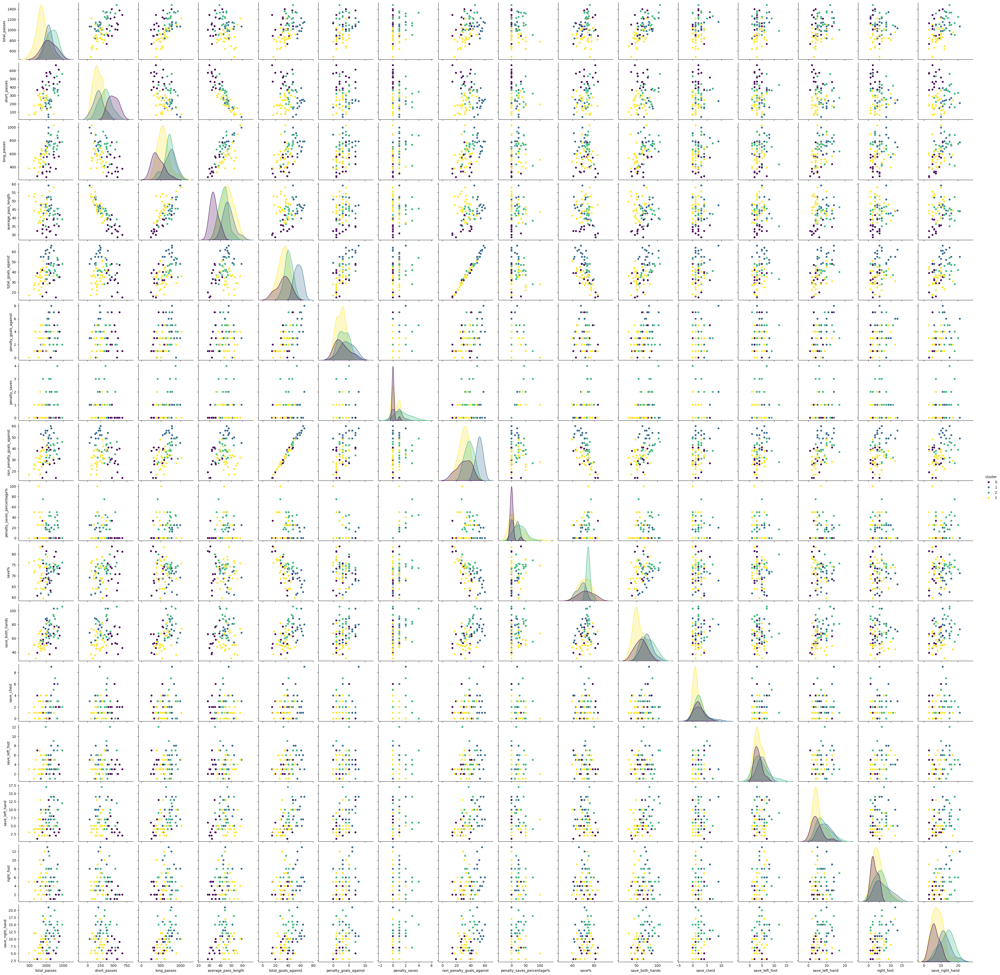

In [101]:
selected_features = ['total_passes', 'short_passes', 'long_passes','average_pass_length', 'total_goals_against',
                    'penalty_goals_against', 'penalty_saves', 'non_penalty_goals_against', 'penalty_saves_percentage%', 'save%', 'save_both_hands',
                    'save_chest', 'save_left_foot', 'save_left_hand', 'right_foot', 'save_right_hand', 'cluster']
sns.pairplot(dfModelGK[selected_features], hue='cluster', palette='viridis')

### Defenders

Feature Selection:
- Total passes.
- Short passes.
- Long passes.
- Average pass length.
- Recoveries.
- Duels Won.
- Fouls committed.
- Shot Blocked.
- Cleararances.
- Interceptions.
- Pressure actions.

In [102]:
dfStats[dfStats.group == 'Defenders']['MP'].describe()

count    720.000000
mean      18.797222
std       10.611511
min        1.000000
25%       10.000000
50%       19.500000
75%       28.000000
max       38.000000
Name: MP, dtype: float64

In [103]:
dfModelDefenders = dfStats[(dfStats.group == 'Defenders') & (dfStats.MP > 18)]

In [104]:
dfModelDefenders = dfModelDefenders[['player', 'total_passes', 'short_passes', 'long_passes', 'crosses', 'f3_passes', 'average_pass_length', 'recoveries',
                    'duels_won', 'fouls_committed', 'shot_blocked', 'clearances', 'interceptions', 'pressure', 'competition', 'team', 'MP', 'position']]

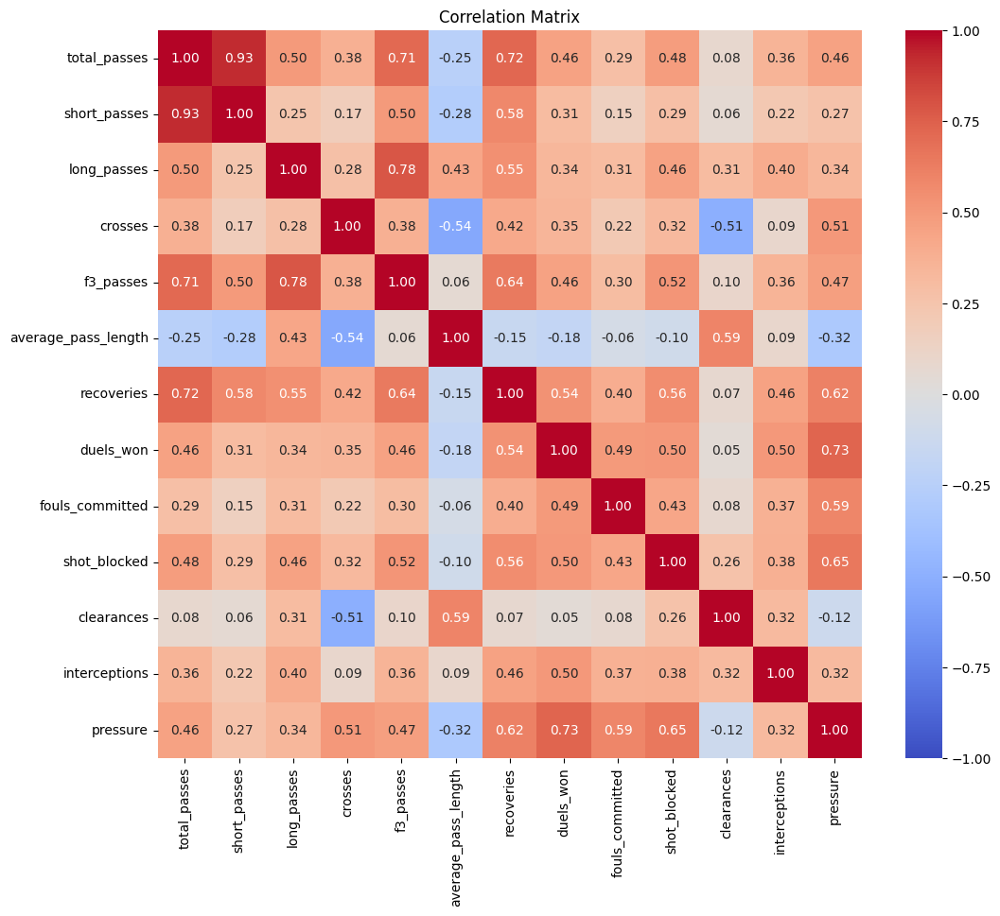

In [105]:
correlation_matrix = dfModelDefenders.drop(['player', 'competition', 'team', 'MP', 'position'], axis=1).corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Matrix")
plt.show()

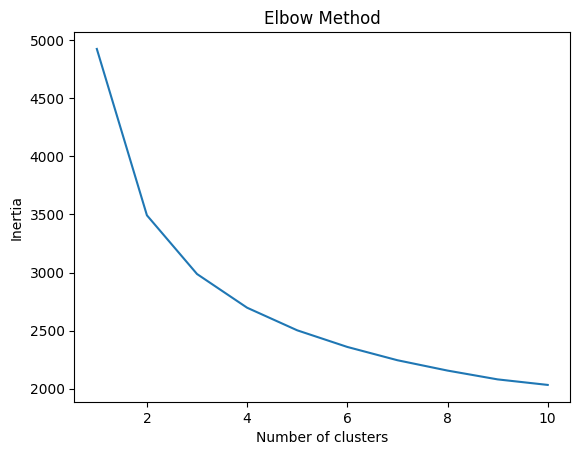

In [106]:
scaler = StandardScaler()
df_scaled = scaler.fit_transform(dfModelDefenders.drop(['player', 'competition', 'team', 'MP', 'position'], axis=1)) 

inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=0).fit(df_scaled)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 11), inertia)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

plt.show()

In [107]:
kmeans = KMeans(n_clusters = 4, random_state=80)
kmeans.fit(df_scaled)
dfModelDefenders['cluster'] = kmeans.predict(df_scaled)

In [108]:
cluster_summary = dfModelDefenders.groupby('cluster').mean()
cluster_summary

,total_passes,short_passes,long_passes,crosses,f3_passes,average_pass_length,recoveries,duels_won,fouls_committed,shot_blocked,clearances,interceptions,pressure,MP
cluster,,,,,,,,,,,,,,
0,1369.686869,747.717172,194.909091,5.040404,163.838384,22.461517,113.898990,29.979798,32.858586,58.929293,173.373737,48.787879,288.666667,31.151515
1,1161.589474,611.157895,122.473684,44.968421,132.263158,17.949485,90.452632,28.063158,29.400000,49.768421,58.326316,30.168421,305.968421,24.600000
2,1757.382716,911.839506,210.679012,65.209877,217.296296,18.584545,145.185185,42.407407,39.049383,71.209877,92.111111,50.839506,424.777778,32.802469
3,834.692308,451.134615,110.519231,6.432692,91.913462,21.323849,65.144231,19.576923,22.250000,39.288462,111.836538,27.961538,196.451923,22.682692


In [109]:
dfModelDefenders.cluster.value_counts()

3    104
0     99
1     95
2     81
Name: cluster, dtype: int64

In [110]:
clusters = dfModelDefenders.groupby('cluster')['player'].apply(list)

# Now, clusters is a Series where the index is the cluster label and the value is a list of teams in that cluster
for cluster_label, players in clusters.items():
    print(f'cluster {cluster_label}: {", ".join(players)}')

cluster 0: Alejandro Arribas Garrido, Aymeric Laporte, Aythami Artiles Oliva, Bruno González Cabrera, David Rodríguez Lombán, Diego Antonio Reyes Rosales, Diego Javier Llorente Ríos, Diego Roberto Godín Leal, Gerard Piqué Bernabéu, Gustavo Daniel Cabral Cáceres, José Eduardo Rosa Vale de Castro, José María Giménez de Vargas, Juan Torres Ruiz, Luis Hernández Rodríguez, Mauro Javier Dos Santos, Pedro Bigas Rigo, Raúl Albentosa Redal, Sergi Gómez Solà, Sergio Ramos García, Shkodran Mustafi, Sidnei Rechel da Silva Júnior, Víctor Ruíz Torre, Weligton Róbson Pena de Oliveira, Xabier Etxeita Gorritxategi, Zouhair Feddal, Álvaro González Soberón, Íñigo Martínez Berridi, Andreas Christensen, Aytac Sulu, Benjamin Hübner, Daniel Brosinski, Daniel Schwaab, Dante Bonfim da Costa Santos, David Ángel Abraham, Dominique Heintz, Emir Spahić, Fabian Lustenberger, Håvard Nordtveit, Jannik Vestergaard, Jonathan Tah, Joël Andre Job Matip, Luca Caldirola, Marvin Matip, Niklas Süle, Ragnar Klavan, Roman Neus

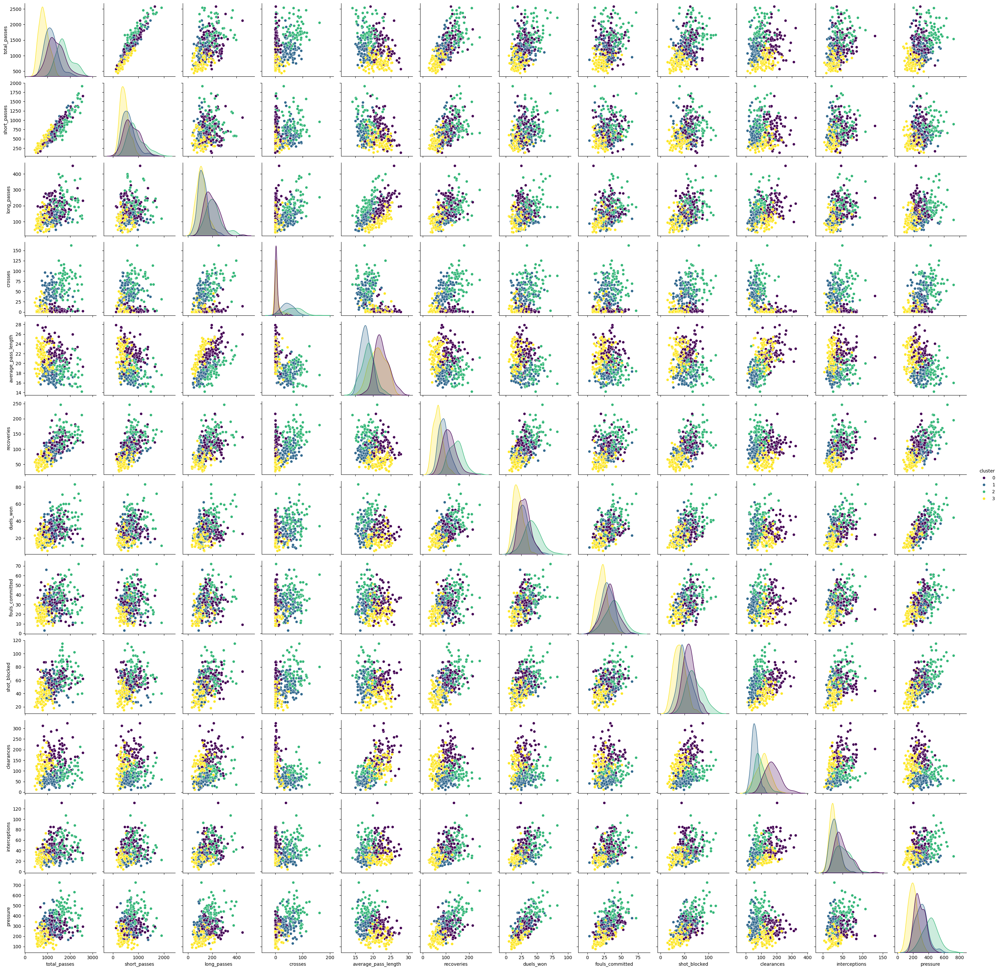

In [111]:
selected_features = ['total_passes', 'short_passes', 'long_passes', 'crosses', 'average_pass_length', 'recoveries',
                    'duels_won', 'fouls_committed', 'shot_blocked', 'clearances', 'interceptions', 'pressure', 'cluster']
sns.pairplot(dfModelDefenders[selected_features], hue='cluster', palette='viridis')

### Midfielders

Feature Selection:
- Total passes.
- Short passes.
- Long passes.
- f3 passes.
- Crosses.
- Shot assists.
- Goals assists.
- Dribbles completed.
- Dribbles f3 completed.
- Fouls won.
- Shots.
- xG.
- Goals.
- Recoveries.
- Duels won.
- Fouls committed.
- Interceptions.
- Pressure.

In [112]:
dfStats[dfStats.group == 'Midfielders']['MP'].describe()

count    700.000000
mean      19.054286
std       11.317118
min        1.000000
25%        9.000000
50%       20.000000
75%       29.000000
max       38.000000
Name: MP, dtype: float64

In [113]:
dfModelMid = dfStats[(dfStats.group == 'Midfielders') & (dfStats.MP > 19)]

In [114]:
dfModelMid = dfModelMid[['player', 'total_passes', 'short_passes', 'long_passes', 'crosses', 'average_pass_length', 'f3_passes', 'total_shot_assists', 'total_goal_assists', 'dribbles_completed', 'dribbles_f3_completed', 
                            'fouls_won', 'total_shots', 'goals', 'xG_total', 'recoveries', 'duels_won', 'fouls_committed', 'interceptions', 'pressure', 'competition', 'team', 'MP', 'position']]

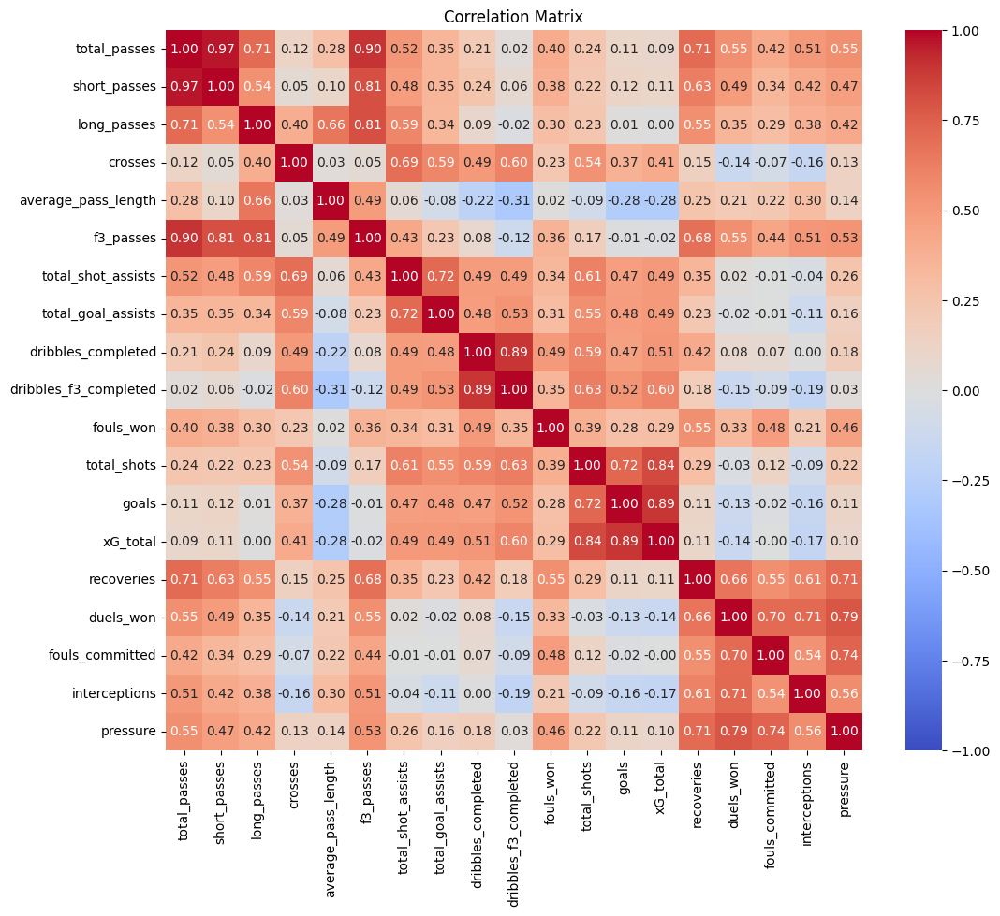

In [115]:
correlation_matrix = dfModelMid.drop(['player', 'competition', 'team', 'MP', 'position'], axis=1).corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Matrix")
plt.show()

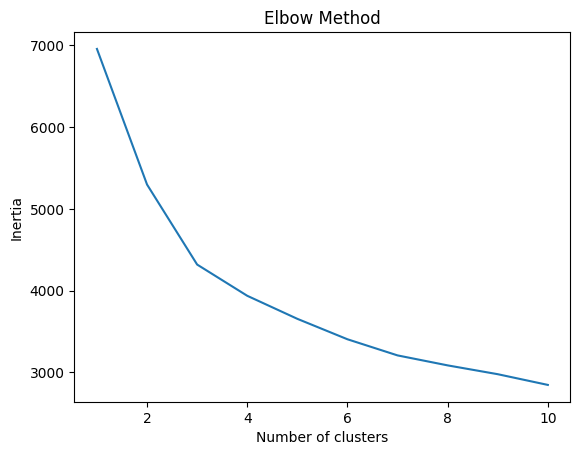

In [116]:
scaler = StandardScaler()
df_scaled = scaler.fit_transform(dfModelMid.drop(['player', 'competition', 'team', 'MP', 'position'], axis=1)) 

inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=0).fit(df_scaled)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 11), inertia)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

plt.show()

In [117]:
kmeans = KMeans(n_clusters = 4, random_state=80)
kmeans.fit(df_scaled)
dfModelMid['cluster'] = kmeans.predict(df_scaled)

In [118]:
cluster_summary = dfModelMid.groupby('cluster').mean()
cluster_summary

,total_passes,short_passes,long_passes,crosses,average_pass_length,f3_passes,total_shot_assists,total_goal_assists,dribbles_completed,dribbles_f3_completed,fouls_won,total_shots,goals,xG_total,recoveries,duels_won,fouls_committed,interceptions,pressure,MP
cluster,,,,,,,,,,,,,,,,,,,,
0,1162.492063,740.523810,121.269841,55.460317,16.862281,132.126984,42.269841,5.412698,50.619048,26.206349,51.888889,56.634921,5.888889,5.361950,132.492063,27.206349,36.587302,19.968254,483.206349,31.222222
1,1990.508197,1249.065574,240.704918,32.901639,19.120190,298.196721,39.262295,3.737705,29.081967,9.196721,53.065574,36.918033,2.573770,2.418378,183.655738,50.426230,50.786885,44.360656,625.606557,33.590164
2,1199.827869,737.081967,115.237705,14.393443,18.392047,165.401639,17.049180,1.352459,20.032787,5.581967,39.967213,24.081967,1.483607,1.622770,135.549180,42.770492,50.270492,37.024590,542.377049,28.803279
3,652.866667,399.975000,60.975000,20.125000,17.012456,78.975000,16.558333,1.483333,17.775000,8.058333,26.041667,22.425000,1.791667,1.826113,77.208333,18.675000,26.241667,16.600000,306.791667,24.425000


In [119]:
clusters = dfModelMid.groupby('cluster')['player'].apply(list)

# Now, clusters is a Series where the index is the cluster label and the value is a list of teams in that cluster
for cluster_label, players in clusters.items():
    print(f'cluster {cluster_label}: {", ".join(players)}')

cluster 0: Alen Halilović, André Filipe Tavares Gomes, Denis Suárez Fernández, Francisco Román Alarcón Suárez, Joaquín Sánchez Rodríguez, José Luis Morales Nogales, Luis Alberto Romero Alconchel, Marco Asensio Willemsen, Pedro Taunausú Domínguez Placeres, Raúl García Escudero, Sergio Gontán Gallardo, Yannick Ferreira Carrasco, Éver Maximiliano David Banega, Daniel Caligiuri, Daniel Didavi, Douglas Costa de Souza, Filip Kostić, Fin Bartels, Hakan Çalhanoğlu, Hiroshi Kiyotake, Ibrahima Traoré, Julian Draxler, Kingsley Coman, Leonardo Bittencourt, Marcel Heller, Max Kruse, Max Meyer, Shinji Kagawa, Thomas Müller, Thorgan Hazard, Yunus Mallı, Zlatko Junuzović, Bruno Miguel Borges Fernandes, Danilo Soddimo, Franco Damián Vázquez, Giacomo Bonaventura, Josip Iličić, Keisuke Honda, Oscar Hiljemark, Paul Pogba, Piotr Zieliński, Riccardo Saponara, Roberto Soriano, Valter Birsa, Adam David Lallana, Bamidele Alli, David Josué Jiménez Silva, Georginio Wijnaldum, Gnégnéri Yaya Touré, Gylfi Þór Sigur

In [120]:
dfModelMid.cluster.value_counts()

2    122
3    120
0     63
1     61
Name: cluster, dtype: int64

### Forwards

Feature Selection:
- Total passes.
- f3 passes.
- Shot assists.
- Goal assists.
- Dribbles completed.
- Dribbles f3 completed.
- Fouls won.
- Total shots.
- On target percentage.
- xG.
- Goals.
- Shot to goal ratio.
- Shot on target to goal ratio.
- xG/shot.
- Pressure.
- Duels won.
- Fouls committed.

In [121]:
dfStats[dfStats.group == 'Forwards']['MP'].describe()

count    519.000000
mean      19.809249
std       11.088806
min        1.000000
25%       10.000000
50%       21.000000
75%       30.000000
max       38.000000
Name: MP, dtype: float64

In [122]:
dfModelFor = dfStats[(dfStats.group == 'Forwards') & (dfStats.MP > 19)]

In [123]:
dfModelFor = dfModelFor[['player', 'total_passes', 'f3_passes', 'total_shot_assists', 'total_goal_assists', 'dribbles_completed', 'dribbles_f3_completed', 
                            'fouls_won', 'total_shots', 'onTarget_percentage%', 'goals', 'xG_total', 'Shot_to_goal_ratio', 'Shot_onTarget_to_goal_ratio', 'xG/shot',
                             'duels_won', 'fouls_committed', 'pressure', 'competition', 'team', 'MP', 'position']]

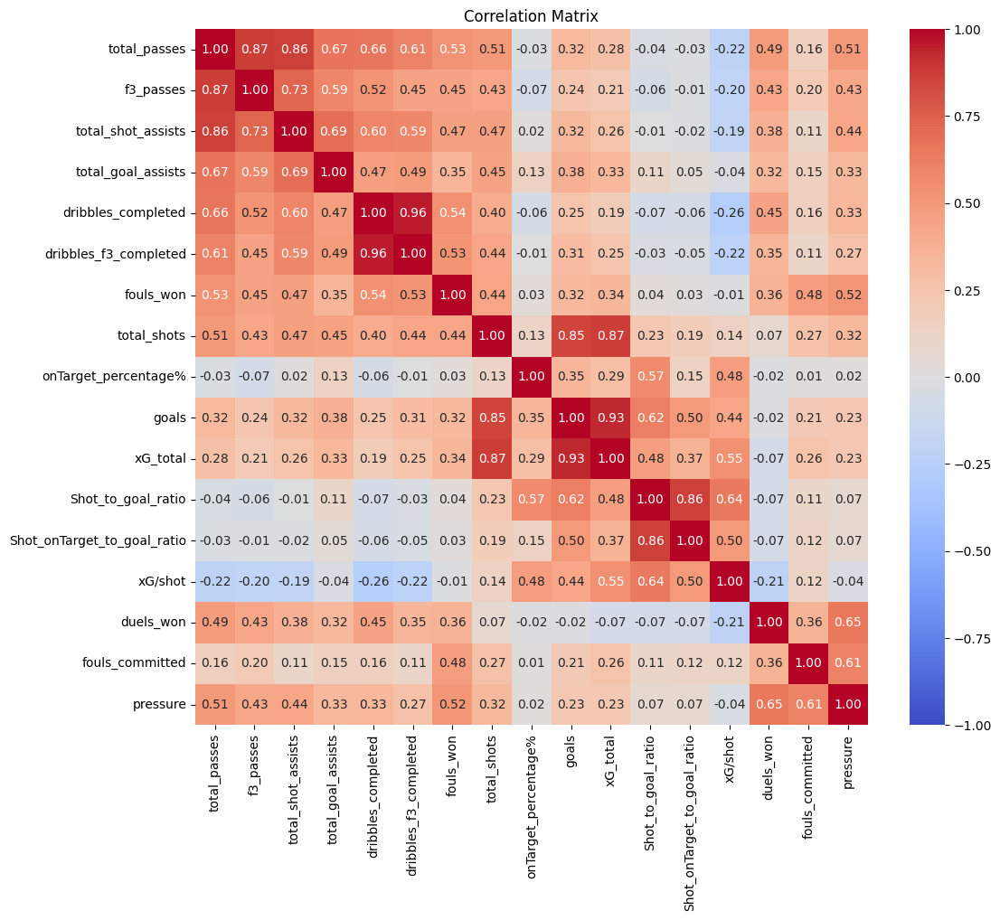

In [124]:
correlation_matrix = dfModelFor.drop(['player', 'competition', 'team', 'MP', 'position'], axis=1).corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Correlation Matrix")
plt.show()

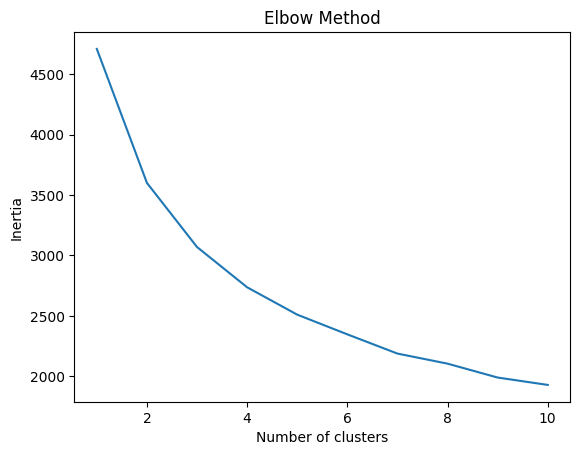

In [125]:
scaler = StandardScaler()
df_scaled = scaler.fit_transform(dfModelFor.drop(['player', 'competition', 'team', 'MP', 'position'], axis=1)) 

inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=0).fit(df_scaled)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 11), inertia)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

plt.show()

In [126]:
kmeans = KMeans(n_clusters = 4, random_state=80)
kmeans.fit(df_scaled)
dfModelFor['cluster'] = kmeans.predict(df_scaled)

In [127]:
cluster_summary = dfModelFor.groupby('cluster').mean()
cluster_summary

,total_passes,f3_passes,total_shot_assists,total_goal_assists,dribbles_completed,dribbles_f3_completed,fouls_won,total_shots,onTarget_percentage%,goals,xG_total,Shot_to_goal_ratio,Shot_onTarget_to_goal_ratio,xG/shot,duels_won,fouls_committed,pressure,MP
cluster,,,,,,,,,,,,,,,,,,
0,1107.202899,110.681159,40.101449,5.072464,53.956522,28.826087,57.507246,61.463768,35.453203,6.536232,5.875650,10.527206,29.729593,0.095743,25.391304,39.391304,474.637681,31.898551
1,476.521277,45.361702,16.776596,1.744681,20.436170,11.159574,26.531915,32.648936,35.441538,2.765957,3.404197,8.365816,23.399142,0.105191,10.989362,23.031915,245.010638,25.159574
2,1022.315789,94.105263,40.842105,6.473684,55.421053,35.210526,57.263158,125.842105,45.826442,24.315789,20.181459,19.648434,42.806526,0.162180,12.578947,33.736842,370.315789,33.894737
3,541.831579,53.231579,18.389474,2.684211,19.894737,10.936842,41.957895,52.547368,41.956924,8.968421,8.167002,17.863007,43.458204,0.156990,13.263158,39.842105,359.736842,29.336842


In [128]:
clusters = dfModelFor.groupby('cluster')['player'].apply(list)

# Now, clusters is a Series where the index is the cluster label and the value is a list of teams in that cluster
for cluster_label, players in clusters.items():
    print(f'cluster {cluster_label}: {", ".join(players)}')

cluster 0: Carlos Alberto Vela Garrido, Fabián Ariel Orellana Valenzuela, Federico Nicolás Cartabia, Hernán Arsenio Pérez González, Isaac Ajayi Success, James David Rodríguez Rubio, Jonathan Rodríguez Menéndez, Jonathan Viera Ramos, Manuel Agudo Durán, Markel Susaeta Laskurain, Pablo Sarabia García, Pedro León Sánchez Gil, Tiago Manuel Dias Correia, Víctor Machín Pérez, Xabier Prieto Argarate, Álvaro Cejudo Carmona, Caiuby Francisco da Silva, Genki Haraguchi, Henrikh Mkhitaryan, Ivo Iličević, Jean-Eric Maxim Choupo-Moting, Karim Bellarabi, Kevin Volland, Lars Edi Stindl, Leroy Sané, Mathew Leckie, Pablo Ezequiel De Blasis, Raffael Caetano de Araújo, Stefan Aigner, Alejandro Darío Gómez, Antonio Candreva, Cyril Théréau, Diego Perotti, Domenico Berardi, Emanuele Giaccherini, Federico Bernardeschi, Federico Dionisi, Felipe Anderson Pereira Gomes, Ivan Perišić, José María Callejón Bueno, Lorenzo Insigne, Manuel Pucciarelli, Mohamed Salah, Nicola Sansone, Stevan Jovetić, Alexis Alejandro Sá

In [129]:
dfModelFor.cluster.value_counts()

3    95
1    94
0    69
2    19
Name: cluster, dtype: int64